In [73]:
import numpy as np
import os
import pydicom as dicom
import imageio
import IPython

In [74]:
INPUT_SHAPE = (600, 600, 3)
DATA = 'input/train'

In [75]:
patient = 'ID00007637202177411956430'
ds = dicom.read_file(f"{DATA}/{patient}/1.dcm")
print(repr(ds))

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 200
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: CT Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 2.25.12297650151329871895440507938349160734
(0002, 0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.1
(0002, 0013) Implementation Version Name         SH: 'OSIRIX_361'
(0002, 0016) Source Application Entity Title     AE: 'ANONYMOUS'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY', 'AXIAL']
(0008, 0018) SOP Instance UID                    UI: 2.25.12297650151329871895440507938349160734
(0008, 0060) Modality                            CS: 'CT'
(0008, 0070) 

In [76]:
print(f"""ImagePositionPatient={repr(ds.ImagePositionPatient)}
PixelSpacing={repr(ds.PixelSpacing)}
SliceThickness={repr(ds.SliceThickness)}
""")

ImagePositionPatient=[-158.700, -153.500, -69.750]
PixelSpacing=[0.652344, 0.652344]
SliceThickness="1.25"



In [77]:
pix = ds.pixel_array
pix.shape

(512, 512)

In [78]:
def load_scan(path):
    slices = [dicom.read_file(f'{path}/{s}') for s in os.listdir(path)]
    slices.sort(key = lambda x: float(x.ImagePositionPatient[2]))
    return slices


def get_pixels_hu(slices, padding=-2000, hu_min=-1200, hu_max=600):
    """Convert to Hounsfield units (HU)"""
    frames = np.stack([s.pixel_array for s in slices])
    # Convert to int16 (from sometimes int16), 
    # should be possible as values should always be low enough (<32k)
    frames = frames.astype(np.int16)
    for i in range(len(slices)):
        f = frames[i]
        s = slices[i]
        if "PixelPaddingValue" in s:
            padding = np.int16(s.PixelPaddingValue)
        slope = np.float64(s.RescaleSlope)
        intercept = np.int16(s.RescaleIntercept)
        # Set outside-of-scan pixels to 0
        f[f == padding] = 0 
        if slope != 1:
            f = slope * f.astype(np.float64)
            print(f'f.dtype={f.dtype}')
            f = f.astype(np.int16)  
        f += intercept
    frames = frames.astype(np.int16)
    rng = hu_max - hu_min
    frames = (frames - hu_min) / rng
    frames[frames < 0] = 0
    frames[frames > 1] = 1
    frames = (frames * 255).astype(np.uint8)
    return frames


def preprocess(dir):
    slices = load_scan(dir)
    res = get_pixels_hu(slices)
    return res
    

scan_array.shape=(30, 512, 512)


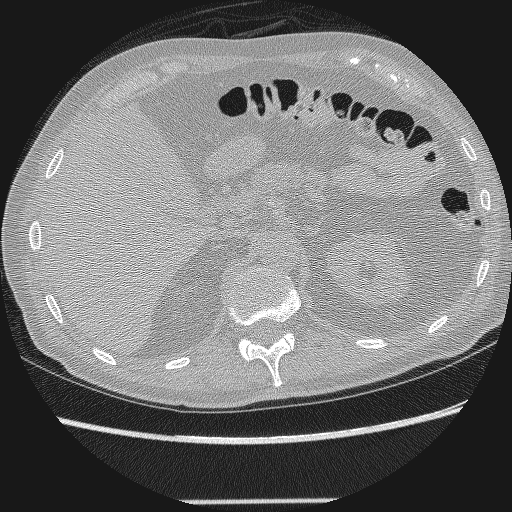

In [79]:
patient = 'ID00007637202177411956430'
scan_array = preprocess(f"{DATA}/{patient}")
print(f'scan_array.shape={scan_array.shape}')
filename = f"tmp/{patient}.gif"
imageio.mimsave(filename, scan_array, duration=0.0001)
IPython.display.Image(filename, format='png')                     

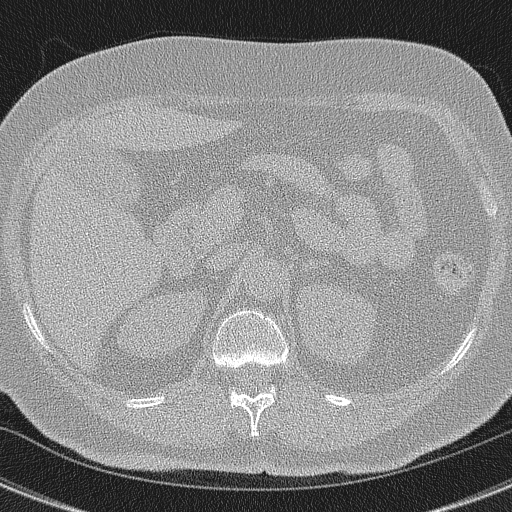

In [80]:
patient = 'ID00023637202179104603099'
scan_array = preprocess(f"{DATA}/{patient}")
filename = f"tmp/{patient}.gif"
imageio.mimsave(filename, scan_array, duration=0.0001)
IPython.display.Image(filename, format='png')   

In [81]:
# patient = 'ID00186637202242472088675'
# this patient has 408 images!